# Plant Disease Classification

In [1]:
import warnings
from sklearn.exceptions import ConvergenceWarning
warnings.filterwarnings("ignore", category=ConvergenceWarning)
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=UserWarning)

import itertools
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from PIL import Image
from sklearn.metrics import classification_report, f1_score , confusion_matrix

# Tensorflow Libraries
import tensorflow as tf
from tensorflow import keras
from keras.layers import Dense, Dropout , BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import layers,models,Model
from keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers.experimental import preprocessing
from tensorflow.keras.callbacks import Callback, EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras import mixed_precision
mixed_precision.set_global_policy('mixed_float16')


print(tf.__version__)

2.12.0


# Loading Dataset

In [2]:
dataset = {
             "train_data" : "/kaggle/input/new-plant-diseases-dataset/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train",
             "valid_data" : "/kaggle/input/new-plant-diseases-dataset/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/valid",
             "test_data" : "/kaggle/input/new-plant-diseases-dataset/test"
          }

all_data = []
for path in dataset.values():
    data = {"imgpath": [] , "labels": [] }
    category = os.listdir(path)

    for folder in category:
        folderpath = os.path.join(path , folder)
        filelist = os.listdir(folderpath)
        for file in filelist:
            fpath = os.path.join(folderpath, file)
            data["imgpath"].append(fpath)
            data["labels"].append(folder)
        
        
    all_data.append(data.copy())
    data.clear()

In [3]:
train_df = pd.DataFrame(all_data[0] , index=range(len(all_data[0]['imgpath'])))
valid_df = pd.DataFrame(all_data[1] , index=range(len(all_data[1]['imgpath'])))
test_df = pd.DataFrame(all_data[2] , index=range(len(all_data[2]['imgpath'])))

train_df

,imgpath,labels
0,/kaggle/input/new-plant-diseases-dataset/New P...,Tomato___Late_blight
1,/kaggle/input/new-plant-diseases-dataset/New P...,Tomato___Late_blight
2,/kaggle/input/new-plant-diseases-dataset/New P...,Tomato___Late_blight
3,/kaggle/input/new-plant-diseases-dataset/New P...,Tomato___Late_blight
4,/kaggle/input/new-plant-diseases-dataset/New P...,Tomato___Late_blight
...,...,...
70290,/kaggle/input/new-plant-diseases-dataset/New P...,Corn_(maize)___healthy
70291,/kaggle/input/new-plant-diseases-dataset/New P...,Corn_(maize)___healthy
70292,/kaggle/input/new-plant-diseases-dataset/New P...,Corn_(maize)___healthy
70293,/kaggle/input/new-plant-diseases-dataset/New P...,Corn_(maize)___healthy


In [4]:
train_df['labels'].value_counts()

Soybean___healthy                                     2022
Apple___Apple_scab                                    2016
Orange___Haunglongbing_(Citrus_greening)              2010
Apple___healthy                                       2008
Pepper,_bell___healthy                                1988
Apple___Black_rot                                     1987
Tomato___Tomato_Yellow_Leaf_Curl_Virus                1961
Potato___Early_blight                                 1939
Potato___Late_blight                                  1939
Tomato___healthy                                      1926
Grape___Esca_(Black_Measles)                          1920
Tomato___Early_blight                                 1920
Pepper,_bell___Bacterial_spot                         1913
Corn_(maize)___Northern_Leaf_Blight                   1908
Corn_(maize)___Common_rust_                           1907
Grape___Black_rot                                     1888
Tomato___Leaf_Mold                                    18

In [5]:
print("Total number of Labels: ",train_df['labels'].nunique())
print("List of all Labels:", train_df['labels'].unique())


Total number of Labels:  38
List of all Labels: ['Tomato___Late_blight' 'Tomato___healthy' 'Grape___healthy'
 'Orange___Haunglongbing_(Citrus_greening)' 'Soybean___healthy'
 'Squash___Powdery_mildew' 'Potato___healthy'
 'Corn_(maize)___Northern_Leaf_Blight' 'Tomato___Early_blight'
 'Tomato___Septoria_leaf_spot'
 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot'
 'Strawberry___Leaf_scorch' 'Peach___healthy' 'Apple___Apple_scab'
 'Tomato___Tomato_Yellow_Leaf_Curl_Virus' 'Tomato___Bacterial_spot'
 'Apple___Black_rot' 'Blueberry___healthy'
 'Cherry_(including_sour)___Powdery_mildew' 'Peach___Bacterial_spot'
 'Apple___Cedar_apple_rust' 'Tomato___Target_Spot'
 'Pepper,_bell___healthy' 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)'
 'Potato___Late_blight' 'Tomato___Tomato_mosaic_virus'
 'Strawberry___healthy' 'Apple___healthy' 'Grape___Black_rot'
 'Potato___Early_blight' 'Cherry_(including_sour)___healthy'
 'Corn_(maize)___Common_rust_' 'Grape___Esca_(Black_Measles)'
 'Raspberry___healthy' '

In [6]:
valid_df

,imgpath,labels
0,/kaggle/input/new-plant-diseases-dataset/New P...,Tomato___Late_blight
1,/kaggle/input/new-plant-diseases-dataset/New P...,Tomato___Late_blight
2,/kaggle/input/new-plant-diseases-dataset/New P...,Tomato___Late_blight
3,/kaggle/input/new-plant-diseases-dataset/New P...,Tomato___Late_blight
4,/kaggle/input/new-plant-diseases-dataset/New P...,Tomato___Late_blight
...,...,...
17567,/kaggle/input/new-plant-diseases-dataset/New P...,Corn_(maize)___healthy
17568,/kaggle/input/new-plant-diseases-dataset/New P...,Corn_(maize)___healthy
17569,/kaggle/input/new-plant-diseases-dataset/New P...,Corn_(maize)___healthy
17570,/kaggle/input/new-plant-diseases-dataset/New P...,Corn_(maize)___healthy


In [7]:
valid_df['labels'].value_counts()

Soybean___healthy                                     505
Apple___Apple_scab                                    504
Orange___Haunglongbing_(Citrus_greening)              503
Apple___healthy                                       502
Pepper,_bell___healthy                                497
Apple___Black_rot                                     497
Tomato___Tomato_Yellow_Leaf_Curl_Virus                490
Potato___Late_blight                                  485
Potato___Early_blight                                 485
Tomato___healthy                                      481
Grape___Esca_(Black_Measles)                          480
Tomato___Early_blight                                 480
Pepper,_bell___Bacterial_spot                         478
Corn_(maize)___Common_rust_                           477
Corn_(maize)___Northern_Leaf_Blight                   477
Grape___Black_rot                                     472
Tomato___Leaf_Mold                                    470
Corn_(maize)__

In [8]:
test_df

,imgpath,labels
0,/kaggle/input/new-plant-diseases-dataset/test/...,test
1,/kaggle/input/new-plant-diseases-dataset/test/...,test
2,/kaggle/input/new-plant-diseases-dataset/test/...,test
3,/kaggle/input/new-plant-diseases-dataset/test/...,test
4,/kaggle/input/new-plant-diseases-dataset/test/...,test
5,/kaggle/input/new-plant-diseases-dataset/test/...,test
6,/kaggle/input/new-plant-diseases-dataset/test/...,test
7,/kaggle/input/new-plant-diseases-dataset/test/...,test
8,/kaggle/input/new-plant-diseases-dataset/test/...,test
9,/kaggle/input/new-plant-diseases-dataset/test/...,test


In [9]:
# #Convert labels to numbers
lb = LabelEncoder()
train_df['encoded_labels'] = lb.fit_transform(train_df['labels'])
valid_df['encoded_labels'] = lb.fit_transform(valid_df['labels'])

In [10]:
train_df

,imgpath,labels,encoded_labels
0,/kaggle/input/new-plant-diseases-dataset/New P...,Tomato___Late_blight,30
1,/kaggle/input/new-plant-diseases-dataset/New P...,Tomato___Late_blight,30
2,/kaggle/input/new-plant-diseases-dataset/New P...,Tomato___Late_blight,30
3,/kaggle/input/new-plant-diseases-dataset/New P...,Tomato___Late_blight,30
4,/kaggle/input/new-plant-diseases-dataset/New P...,Tomato___Late_blight,30
...,...,...,...
70290,/kaggle/input/new-plant-diseases-dataset/New P...,Corn_(maize)___healthy,10
70291,/kaggle/input/new-plant-diseases-dataset/New P...,Corn_(maize)___healthy,10
70292,/kaggle/input/new-plant-diseases-dataset/New P...,Corn_(maize)___healthy,10
70293,/kaggle/input/new-plant-diseases-dataset/New P...,Corn_(maize)___healthy,10


In [11]:
valid_df

,imgpath,labels,encoded_labels
0,/kaggle/input/new-plant-diseases-dataset/New P...,Tomato___Late_blight,30
1,/kaggle/input/new-plant-diseases-dataset/New P...,Tomato___Late_blight,30
2,/kaggle/input/new-plant-diseases-dataset/New P...,Tomato___Late_blight,30
3,/kaggle/input/new-plant-diseases-dataset/New P...,Tomato___Late_blight,30
4,/kaggle/input/new-plant-diseases-dataset/New P...,Tomato___Late_blight,30
...,...,...,...
17567,/kaggle/input/new-plant-diseases-dataset/New P...,Corn_(maize)___healthy,10
17568,/kaggle/input/new-plant-diseases-dataset/New P...,Corn_(maize)___healthy,10
17569,/kaggle/input/new-plant-diseases-dataset/New P...,Corn_(maize)___healthy,10
17570,/kaggle/input/new-plant-diseases-dataset/New P...,Corn_(maize)___healthy,10


In [12]:
valid_df , test_df = train_test_split(valid_df ,  train_size= 0.90 , shuffle=True, random_state=124)
valid_df = valid_df.reset_index(drop=True)
test_df = test_df.reset_index(drop=True)
valid_df

,imgpath,labels,encoded_labels
0,/kaggle/input/new-plant-diseases-dataset/New P...,Apple___Cedar_apple_rust,2
1,/kaggle/input/new-plant-diseases-dataset/New P...,Raspberry___healthy,23
2,/kaggle/input/new-plant-diseases-dataset/New P...,Corn_(maize)___Common_rust_,8
3,/kaggle/input/new-plant-diseases-dataset/New P...,Grape___Esca_(Black_Measles),12
4,/kaggle/input/new-plant-diseases-dataset/New P...,Apple___Apple_scab,0
...,...,...,...
15809,/kaggle/input/new-plant-diseases-dataset/New P...,Tomato___healthy,37
15810,/kaggle/input/new-plant-diseases-dataset/New P...,Peach___Bacterial_spot,16
15811,/kaggle/input/new-plant-diseases-dataset/New P...,Corn_(maize)___Common_rust_,8
15812,/kaggle/input/new-plant-diseases-dataset/New P...,Corn_(maize)___Cercospora_leaf_spot Gray_leaf_...,7


In [13]:
valid_df['labels'].value_counts()

Apple___healthy                                       460
Apple___Apple_scab                                    460
Soybean___healthy                                     453
Orange___Haunglongbing_(Citrus_greening)              452
Apple___Black_rot                                     448
Potato___Early_blight                                 446
Pepper,_bell___healthy                                445
Tomato___Tomato_Yellow_Leaf_Curl_Virus                438
Corn_(maize)___Northern_Leaf_Blight                   435
Tomato___Early_blight                                 434
Potato___Late_blight                                  433
Tomato___Leaf_Mold                                    430
Grape___Esca_(Black_Measles)                          428
Pepper,_bell___Bacterial_spot                         427
Tomato___healthy                                      427
Corn_(maize)___Common_rust_                           424
Peach___Bacterial_spot                                421
Grape___Black_

In [14]:
test_df

,imgpath,labels,encoded_labels
0,/kaggle/input/new-plant-diseases-dataset/New P...,Tomato___healthy,37
1,/kaggle/input/new-plant-diseases-dataset/New P...,Potato___Early_blight,20
2,/kaggle/input/new-plant-diseases-dataset/New P...,Cherry_(including_sour)___healthy,6
3,/kaggle/input/new-plant-diseases-dataset/New P...,Tomato___Tomato_mosaic_virus,36
4,/kaggle/input/new-plant-diseases-dataset/New P...,Grape___Esca_(Black_Measles),12
...,...,...,...
1753,/kaggle/input/new-plant-diseases-dataset/New P...,Cherry_(including_sour)___healthy,6
1754,/kaggle/input/new-plant-diseases-dataset/New P...,Apple___Cedar_apple_rust,2
1755,/kaggle/input/new-plant-diseases-dataset/New P...,Corn_(maize)___healthy,10
1756,/kaggle/input/new-plant-diseases-dataset/New P...,Tomato___Early_blight,29


In [15]:
test_df['labels'].value_counts()

Tomato___Spider_mites Two-spotted_spider_mite         60
Tomato___healthy                                      54
Grape___Black_rot                                     54
Corn_(maize)___Common_rust_                           53
Grape___Leaf_blight_(Isariopsis_Leaf_Spot)            53
Soybean___healthy                                     52
Grape___Esca_(Black_Measles)                          52
Pepper,_bell___healthy                                52
Tomato___Tomato_Yellow_Leaf_Curl_Virus                52
Potato___Late_blight                                  52
Orange___Haunglongbing_(Citrus_greening)              51
Pepper,_bell___Bacterial_spot                         51
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot    51
Tomato___Late_blight                                  50
Strawberry___healthy                                  49
Apple___Black_rot                                     49
Corn_(maize)___healthy                                49
Apple___Cedar_apple_rust       

# Training Data images count per class

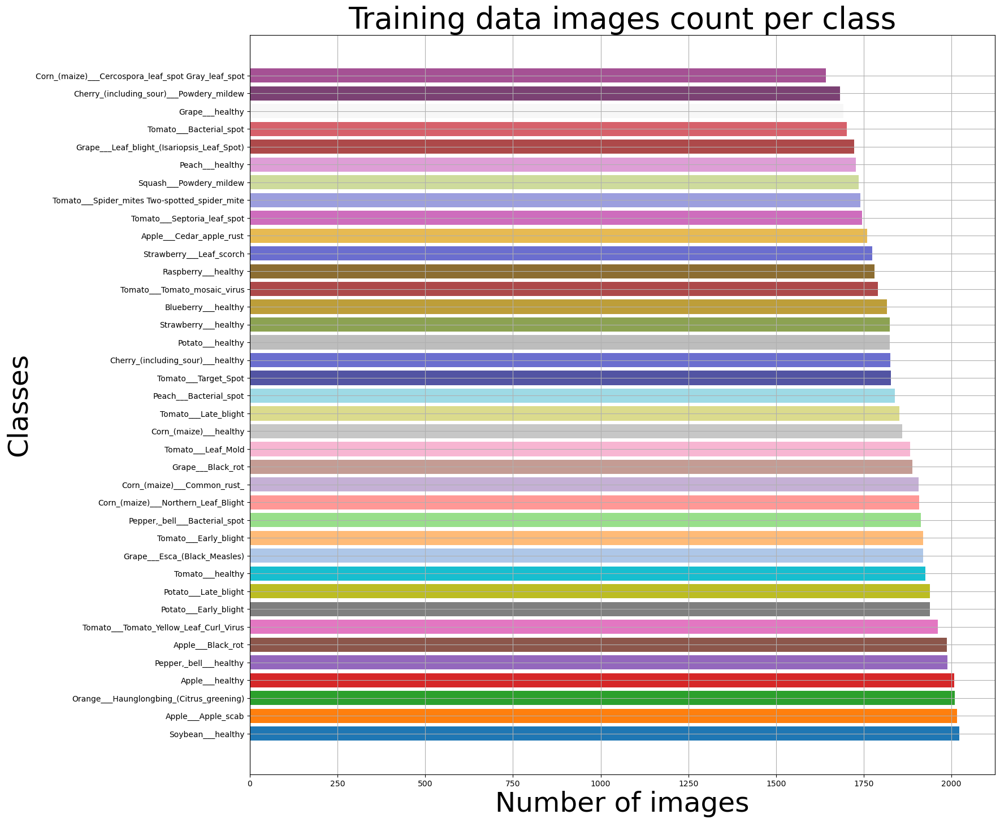

In [16]:
train  = train_df["labels"].value_counts()
label = train.tolist()
index = train.index.tolist()

colors = [
    "#1f77b4", "#ff7f0e", "#2ca02c", "#d62728", "#9467bd",
    "#8c564b", "#e377c2", "#7f7f7f", "#bcbd22", "#17becf",
    "#aec7e8", "#ffbb78", "#98df8a", "#ff9896", "#c5b0d5",
    "#c49c94", "#f7b6d2", "#c7c7c7", "#dbdb8d", "#9edae5",
    "#5254a3", "#6b6ecf", "#bdbdbd", "#8ca252", "#bd9e39",
    "#ad494a", "#8c6d31", "#6b6ecf", "#e7ba52", "#ce6dbd",
    "#9c9ede", "#cedb9c", "#de9ed6", "#ad494a", "#d6616b",
    "#f7f7f7", "#7b4173", "#a55194", "#ce6dbd"
]

plt.figure(figsize=(17,17))
plt.title("Training data images count per class",fontsize=38)
plt.xlabel('Number of images', fontsize=35)
plt.ylabel('Classes', fontsize=35)
plt.barh(index,label, color=colors)
plt.grid(True)
plt.show()

In [17]:
train_df.sample(n=15, random_state=1)

,imgpath,labels,encoded_labels
59490,/kaggle/input/new-plant-diseases-dataset/New P...,Grape___Esca_(Black_Measles),12
58840,/kaggle/input/new-plant-diseases-dataset/New P...,Corn_(maize)___Common_rust_,8
11750,/kaggle/input/new-plant-diseases-dataset/New P...,Potato___healthy,22
19617,/kaggle/input/new-plant-diseases-dataset/New P...,Corn_(maize)___Cercospora_leaf_spot Gray_leaf_...,7
48429,/kaggle/input/new-plant-diseases-dataset/New P...,Strawberry___healthy,27
46935,/kaggle/input/new-plant-diseases-dataset/New P...,Tomato___Tomato_mosaic_virus,36
42758,/kaggle/input/new-plant-diseases-dataset/New P...,Grape___Leaf_blight_(Isariopsis_Leaf_Spot),13
33007,/kaggle/input/new-plant-diseases-dataset/New P...,Blueberry___healthy,4
42522,/kaggle/input/new-plant-diseases-dataset/New P...,Grape___Leaf_blight_(Isariopsis_Leaf_Spot),13
43380,/kaggle/input/new-plant-diseases-dataset/New P...,Grape___Leaf_blight_(Isariopsis_Leaf_Spot),13


In [18]:
print("----------Train-------------")
print(train_df[["imgpath", "labels"]].head(5))
print(train_df.shape)
print("--------Validation----------")
print(valid_df[["imgpath", "labels"]].head(5))
print(valid_df.shape)
print("----------Test--------------")
print(test_df[["imgpath", "labels"]].head(5))
print(test_df.shape)

----------Train-------------
                                             imgpath                labels
0  /kaggle/input/new-plant-diseases-dataset/New P...  Tomato___Late_blight
1  /kaggle/input/new-plant-diseases-dataset/New P...  Tomato___Late_blight
2  /kaggle/input/new-plant-diseases-dataset/New P...  Tomato___Late_blight
3  /kaggle/input/new-plant-diseases-dataset/New P...  Tomato___Late_blight
4  /kaggle/input/new-plant-diseases-dataset/New P...  Tomato___Late_blight
(70295, 3)
--------Validation----------
                                             imgpath  \
0  /kaggle/input/new-plant-diseases-dataset/New P...   
1  /kaggle/input/new-plant-diseases-dataset/New P...   
2  /kaggle/input/new-plant-diseases-dataset/New P...   
3  /kaggle/input/new-plant-diseases-dataset/New P...   
4  /kaggle/input/new-plant-diseases-dataset/New P...   

                         labels  
0      Apple___Cedar_apple_rust  
1           Raspberry___healthy  
2   Corn_(maize)___Common_rust_  
3  Grape

# Show sample from data

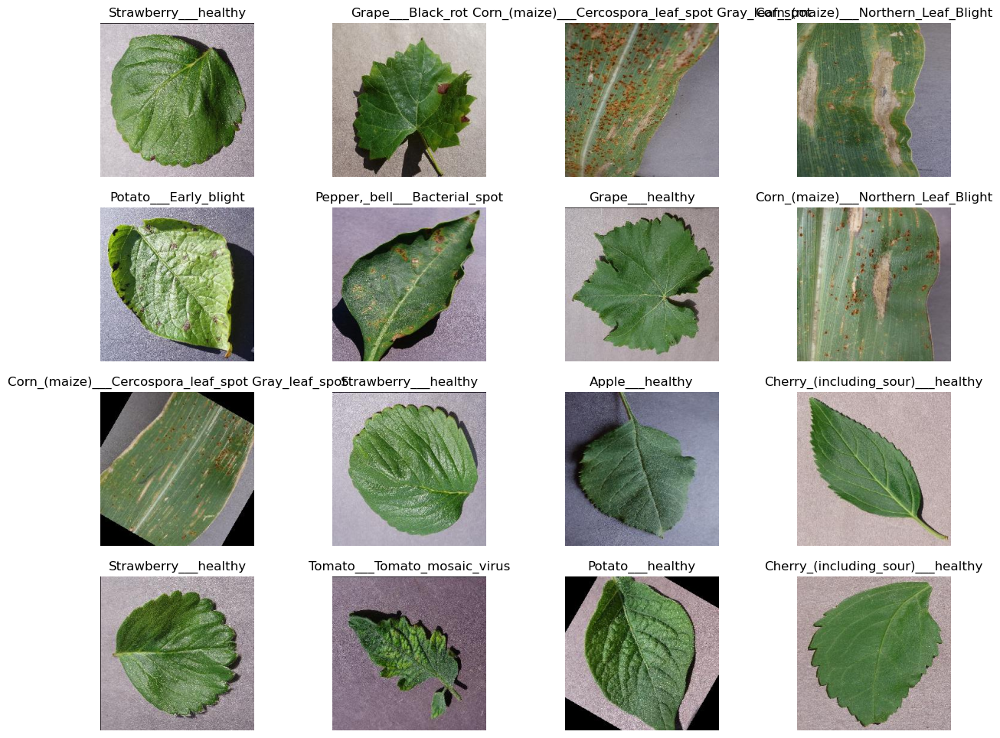

In [19]:
plt.figure(figsize=(15,12))
for i, row in valid_df.sample(n=16).reset_index().iterrows():
    plt.subplot(4,4,i+1)
    image_path = row['imgpath']
    image = Image.open(image_path)
    plt.imshow(image)
    plt.title(row["labels"])
    plt.axis('off')
plt.show()

# Creating Dataloaders

In [20]:
%%time

BATCH_SIZE = 32
IMAGE_SIZE = (224, 224)


generator = ImageDataGenerator(
    preprocessing_function = tf.keras.applications.efficientnet.preprocess_input,
    # there could be image augmentation here
)

# Split the data into three categories.
train_images = generator.flow_from_dataframe(
    dataframe=train_df,
    x_col='imgpath',
    y_col='labels',
    target_size=IMAGE_SIZE,
    color_mode='rgb',
    class_mode='categorical',
    batch_size=BATCH_SIZE,
    shuffle=True,
    seed=42,
)

val_images = generator.flow_from_dataframe(
    dataframe=valid_df,
    x_col='imgpath',
    y_col='labels',
    target_size=IMAGE_SIZE,
    color_mode='rgb',
    class_mode='categorical',
    batch_size=BATCH_SIZE,
    shuffle=False
)

test_images = generator.flow_from_dataframe(
    dataframe=test_df,
    x_col='imgpath',
    y_col='labels',
    target_size=IMAGE_SIZE,
    color_mode='rgb',
    class_mode='categorical',
    batch_size=BATCH_SIZE,
    shuffle=False
)

Found 70295 validated image filenames belonging to 38 classes.
Found 15814 validated image filenames belonging to 38 classes.
Found 1758 validated image filenames belonging to 38 classes.
CPU times: user 1.52 s, sys: 1.9 s, total: 3.42 s
Wall time: 59.2 s


# Model Structure

In [21]:
# Load the pretained model
pretrained_model = tf.keras.applications.EfficientNetB5(
    input_shape=(224, 224, 3),
    include_top=False, # we don`t need a pre-trained top layer (output layer)
    weights='imagenet',
    pooling='max'
)


# Freezing the layers of a pretrained neural network
for i, layer in enumerate(pretrained_model.layers):
    pretrained_model.layers[i].trainable = False

In [22]:
pretrained_model.summary()

Model: "efficientnetb5"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 rescaling (Rescaling)          (None, 224, 224, 3)  0           ['input_1[0][0]']                
                                                                                                  
 normalization (Normalization)  (None, 224, 224, 3)  7           ['rescaling[0][0]']              
                                                                                                  
 rescaling_1 (Rescaling)        (None, 224, 224, 3)  0           ['normalization[0][0

# Training : Transfer Learning

In [23]:
num_classes = len(set(train_images.classes))

# Data Augmentation Step
augment = tf.keras.Sequential([
  layers.experimental.preprocessing.RandomFlip("horizontal"),
  layers.experimental.preprocessing.RandomRotation(0.1),
  layers.experimental.preprocessing.RandomZoom(0.1),
  layers.experimental.preprocessing.RandomContrast(0.1),
], name='AugmentationLayer')


inputs = layers.Input(shape = (224,224,3), name='inputLayer')
x = augment(inputs)
pretrain_out = pretrained_model(x, training = False)
x = layers.Dense(256)(pretrain_out)
x = layers.Activation(activation="relu")(x) 
x = BatchNormalization()(x)
x = layers.Dropout(0.3)(x)
x = layers.Dense(num_classes)(x)
outputs = layers.Activation(activation="softmax", dtype=tf.float32, name='activationLayer')(x) # mixed_precision need separated Dense and Activation layers
model = Model(inputs=inputs, outputs=outputs)

model.compile(
    optimizer=Adam(0.0005),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inputLayer (InputLayer)     [(None, 224, 224, 3)]     0         
                                                                 
 AugmentationLayer (Sequenti  (None, 224, 224, 3)      0         
 al)                                                             
                                                                 
 efficientnetb5 (Functional)  (None, 2048)             28513527  
                                                                 
 dense (Dense)               (None, 256)               524544    
                                                                 
 activation (Activation)     (None, 256)               0         
                                                                 
 batch_normalization (BatchN  (None, 256)              1024      
 ormalization)                                               

In [76]:
for layer in model.layers:
  print(layer)

In [24]:
history = model.fit(
    train_images,
    steps_per_epoch=len(train_images),
    validation_data=val_images,
    validation_steps=len(val_images),
    epochs=10,
    callbacks=[
        EarlyStopping(monitor = "val_loss", # watch the val loss metric
                               patience = 3,
                               restore_best_weights = True), 
        ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=2, mode='min') 
    ]
)
model.save_weights('plant.h5')

Epoch 1/10
2197/2197 [==============================] - 352s 150ms/step - loss: 0.7864 - accuracy: 0.7780 - val_loss: 0.8191 - val_accuracy: 0.7396 - lr: 5.0000e-04
Epoch 2/10
2197/2197 [==============================] - 336s 153ms/step - loss: 0.4575 - accuracy: 0.8627 - val_loss: 0.4855 - val_accuracy: 0.8403 - lr: 5.0000e-04
Epoch 3/10
2197/2197 [==============================] - 320s 146ms/step - loss: 0.4060 - accuracy: 0.8746 - val_loss: 0.3355 - val_accuracy: 0.8888 - lr: 5.0000e-04
Epoch 4/10
2197/2197 [==============================] - 347s 158ms/step - loss: 0.3843 - accuracy: 0.8802 - val_loss: 0.4182 - val_accuracy: 0.8611 - lr: 5.0000e-04
Epoch 5/10
2197/2197 [==============================] - 339s 154ms/step - loss: 0.3558 - accuracy: 0.8869 - val_loss: 0.3725 - val_accuracy: 0.8801 - lr: 5.0000e-04
Epoch 6/10
2197/2197 [==============================] - 325s 148ms/step - loss: 0.2865 - accuracy: 0.9074 - val_loss: 0.1972 - val_accuracy: 0.9363 - lr: 1.0000e-04
Epoch 7/10

# Display model performance

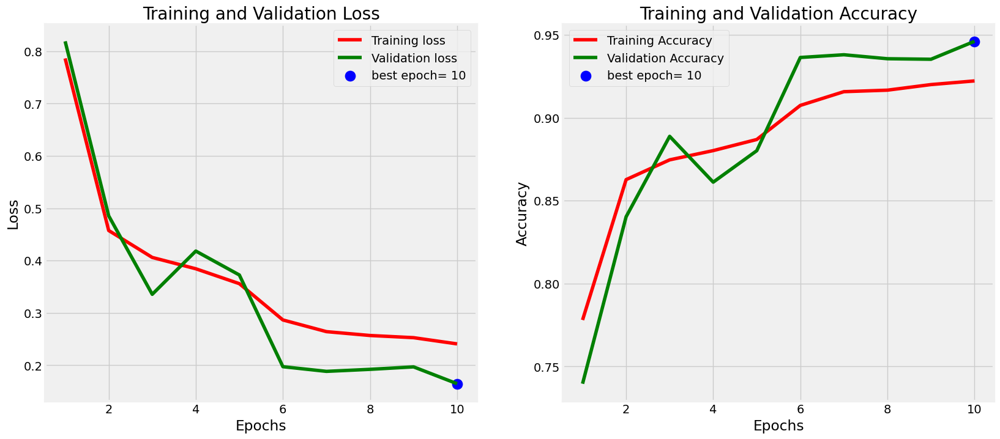

In [25]:
# Define needed variables
tr_acc = history.history['accuracy']
tr_loss = history.history['loss']
val_acc = history.history['val_accuracy']
val_loss = history.history['val_loss']
index_loss = np.argmin(val_loss)
val_lowest = val_loss[index_loss]
index_acc = np.argmax(val_acc)
acc_highest = val_acc[index_acc]
Epochs = [i+1 for i in range(len(tr_acc))]
loss_label = f'best epoch= {str(index_loss + 1)}'
acc_label = f'best epoch= {str(index_acc + 1)}'

# Plot training history
plt.figure(figsize= (20, 8))
plt.style.use('fivethirtyeight')

plt.subplot(1, 2, 1)
plt.plot(Epochs, tr_loss, 'r', label= 'Training loss')
plt.plot(Epochs, val_loss, 'g', label= 'Validation loss')
plt.scatter(index_loss + 1, val_lowest, s= 150, c= 'blue', label= loss_label)
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(Epochs, tr_acc, 'r', label= 'Training Accuracy')
plt.plot(Epochs, val_acc, 'g', label= 'Validation Accuracy')
plt.scatter(index_acc + 1 , acc_highest, s= 150, c= 'blue', label= acc_label)
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout
plt.show()

# Training : Fine Tuning

In [26]:
pretrained_model.trainable = True
for layer in pretrained_model.layers:
    if isinstance(layer, layers.BatchNormalization): # set BatchNorm layers as not trainable
        layer.trainable = False
        
# let`s see first 10 layers
for l in pretrained_model.layers[:10]:
    print(l.name, l.trainable)

model.compile(
    optimizer=Adam(0.00001), # fine tuning requires very little learning rate
    loss='categorical_crossentropy',
    metrics=['accuracy']
)
# model.load_weights('./checkpoints/my_checkpoint')
model.summary()


input_1 True
rescaling True
normalization True
rescaling_1 True
stem_conv_pad True
stem_conv True
stem_bn False
stem_activation True
block1a_dwconv True
block1a_bn False
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inputLayer (InputLayer)     [(None, 224, 224, 3)]     0         
                                                                 
 AugmentationLayer (Sequenti  (None, None, None, None)  0        
 al)                                                             
                                                                 
 efficientnetb5 (Functional)  (None, 2048)             28513527  
                                                                 
 dense (Dense)               (None, 256)               524544    
                                                                 
 activation (Activation)     (None, 256)               0         
                       

In [28]:
history = model.fit(
    train_images,
    steps_per_epoch=len(train_images),
    validation_data=val_images,
    validation_steps=len(val_images),
    epochs=3,
    callbacks=[
        EarlyStopping(monitor = "val_loss", # watch the val loss metric
                               patience = 5,
                               restore_best_weights = True), # if val loss decreases for 5 epochs in a row, stop training,
        ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=2, mode='min') 
    ]
)
model.save_weights('plant1.h5')

Epoch 1/3
2197/2197 [==============================] - 909s 414ms/step - loss: 0.1142 - accuracy: 0.9638 - val_loss: 0.0567 - val_accuracy: 0.9827 - lr: 1.0000e-05
Epoch 2/3
2197/2197 [==============================] - 899s 409ms/step - loss: 0.0517 - accuracy: 0.9848 - val_loss: 0.0355 - val_accuracy: 0.9886 - lr: 1.0000e-05
Epoch 3/3
2197/2197 [==============================] - 897s 408ms/step - loss: 0.0310 - accuracy: 0.9911 - val_loss: 0.0263 - val_accuracy: 0.9920 - lr: 1.0000e-05


# Display model performance

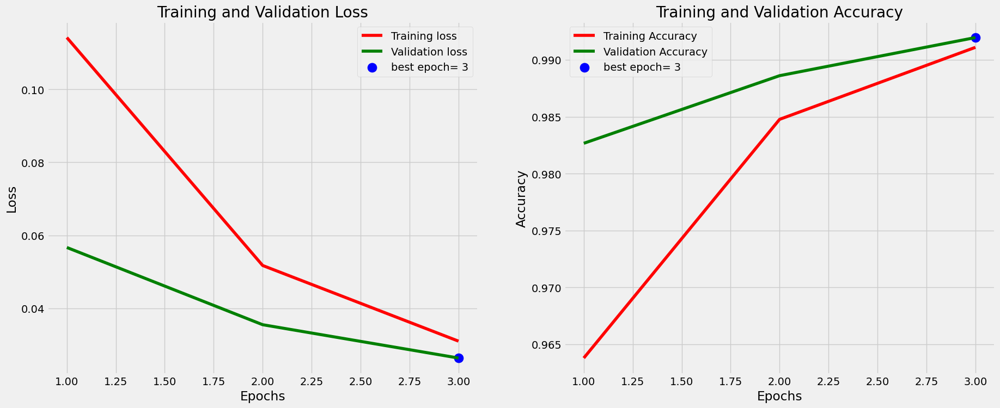

In [29]:
# Define needed variables
tr_acc = history.history['accuracy']
tr_loss = history.history['loss']
val_acc = history.history['val_accuracy']
val_loss = history.history['val_loss']
index_loss = np.argmin(val_loss)
val_lowest = val_loss[index_loss]
index_acc = np.argmax(val_acc)
acc_highest = val_acc[index_acc]
Epochs = [i+1 for i in range(len(tr_acc))]
loss_label = f'best epoch= {str(index_loss + 1)}'
acc_label = f'best epoch= {str(index_acc + 1)}'

# Plot training history
plt.figure(figsize= (20, 8))
plt.style.use('fivethirtyeight')

plt.subplot(1, 2, 1)
plt.plot(Epochs, tr_loss, 'r', label= 'Training loss')
plt.plot(Epochs, val_loss, 'g', label= 'Validation loss')
plt.scatter(index_loss + 1, val_lowest, s= 150, c= 'blue', label= loss_label)
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(Epochs, tr_acc, 'r', label= 'Training Accuracy')
plt.plot(Epochs, val_acc, 'g', label= 'Validation Accuracy')
plt.scatter(index_acc + 1 , acc_highest, s= 150, c= 'blue', label= acc_label)
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout
plt.show()

# model.evaluate on test data

In [30]:
results = model.evaluate(test_images, verbose=0)

print("    Test Loss: {:.5f}".format(results[0]))
print("Test Accuracy: {:.2f}%".format(results[1] * 100))

    Test Loss: 0.02674
Test Accuracy: 99.09%


# F1 Score / Recall / Precision

In [32]:
y_true = test_images.classes
y_pred = np.argmax(model.predict(test_images), axis = 1)
f1 = f1_score(y_true, y_pred, average='macro')
print("F1 Score:", f1)
print(classification_report(y_true, y_pred, target_names=test_images.class_indices.keys()))

55/55 [==============================] - 6s 111ms/step
F1 Score: 0.9912087498929538
                                                    precision    recall  f1-score   support

                                Apple___Apple_scab       1.00      1.00      1.00        44
                                 Apple___Black_rot       1.00      1.00      1.00        49
                          Apple___Cedar_apple_rust       1.00      0.98      0.99        48
                                   Apple___healthy       1.00      1.00      1.00        42
                               Blueberry___healthy       1.00      1.00      1.00        43
          Cherry_(including_sour)___Powdery_mildew       1.00      1.00      1.00        42
                 Cherry_(including_sour)___healthy       1.00      1.00      1.00        46
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.96      0.90      0.93        51
                       Corn_(maize)___Common_rust_       0.98      1.00      0.99      

# Get Predictions

In [38]:
classes = dict(zip(test_images.class_indices.values(), test_images.class_indices.keys()))
Predictions = pd.DataFrame({"Image Index" : list(range(len(test_images.labels))), 
                            "Test Labels" : test_images.labels, 
                            "Test Classes" : [classes[i] for i in test_images.labels],
                            "Prediction Labels" : y_pred,
                            "Prediction Classes" : [classes[i] for i in y_pred],
                            "Path": test_images.filenames,
                            "Prediction Probability" : [x for x in np.asarray(tf.reduce_max(model.predict(test_images), axis = 1))]
                           })
Predictions.head(10)

55/55 [==============================] - 6s 114ms/step


,Image Index,Test Labels,Test Classes,Prediction Labels,Prediction Classes,Path,Prediction Probability
0,0,37,Tomato___healthy,37,Tomato___healthy,/kaggle/input/new-plant-diseases-dataset/New P...,0.999981
1,1,20,Potato___Early_blight,20,Potato___Early_blight,/kaggle/input/new-plant-diseases-dataset/New P...,0.999909
2,2,6,Cherry_(including_sour)___healthy,6,Cherry_(including_sour)___healthy,/kaggle/input/new-plant-diseases-dataset/New P...,0.997447
3,3,36,Tomato___Tomato_mosaic_virus,36,Tomato___Tomato_mosaic_virus,/kaggle/input/new-plant-diseases-dataset/New P...,0.999727
4,4,12,Grape___Esca_(Black_Measles),12,Grape___Esca_(Black_Measles),/kaggle/input/new-plant-diseases-dataset/New P...,0.999987
5,5,10,Corn_(maize)___healthy,10,Corn_(maize)___healthy,/kaggle/input/new-plant-diseases-dataset/New P...,0.999993
6,6,12,Grape___Esca_(Black_Measles),12,Grape___Esca_(Black_Measles),/kaggle/input/new-plant-diseases-dataset/New P...,0.998735
7,7,16,Peach___Bacterial_spot,16,Peach___Bacterial_spot,/kaggle/input/new-plant-diseases-dataset/New P...,0.999750
8,8,36,Tomato___Tomato_mosaic_virus,36,Tomato___Tomato_mosaic_virus,/kaggle/input/new-plant-diseases-dataset/New P...,0.998388
9,9,6,Cherry_(including_sour)___healthy,6,Cherry_(including_sour)___healthy,/kaggle/input/new-plant-diseases-dataset/New P...,0.999993


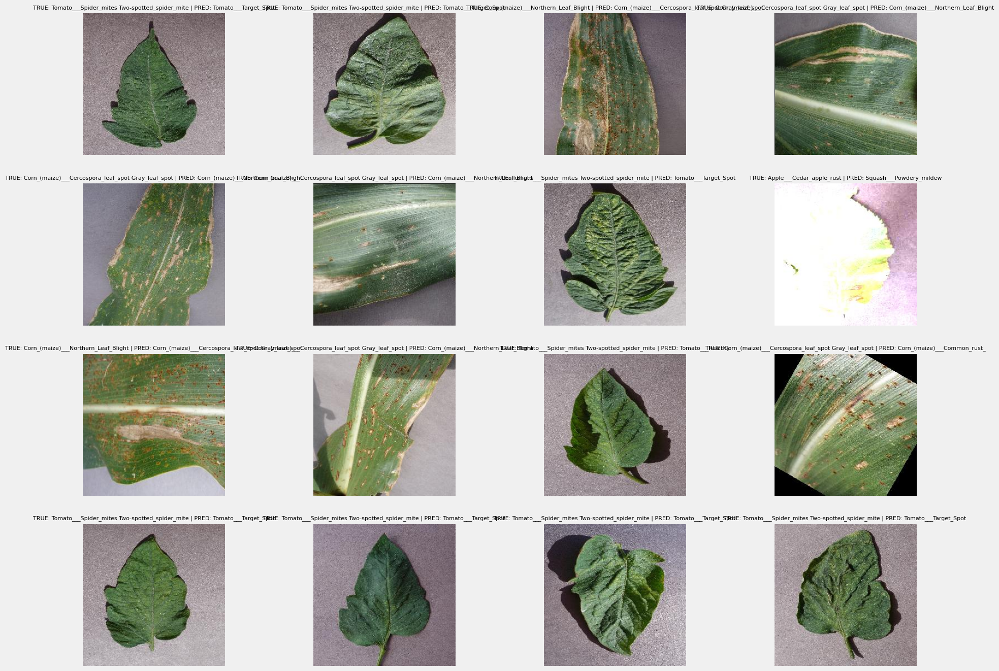

In [34]:
# plot images that were wrongly predicted by a model

plt.figure(figsize=(20,20))
for i, row in Predictions[Predictions["Test Labels"] != Predictions["Prediction Labels"]].sort_values("Prediction Probability").tail(20).reset_index().iterrows():
    plt.subplot(5,4,i+1)
    image_path = row['Path']
    image = Image.open(image_path)
    plt.imshow(image)
    plt.title(f'TRUE: {row["Test Classes"]} | PRED: {row["Prediction Classes"]}', fontsize=8)
    plt.axis('off')
    
plt.show()

<Figure size 2000x1500 with 0 Axes>

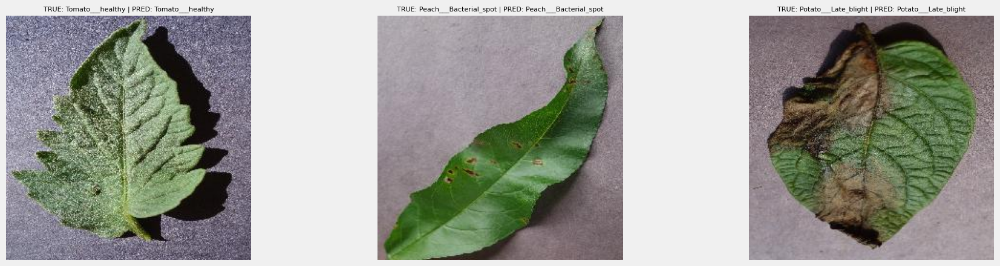

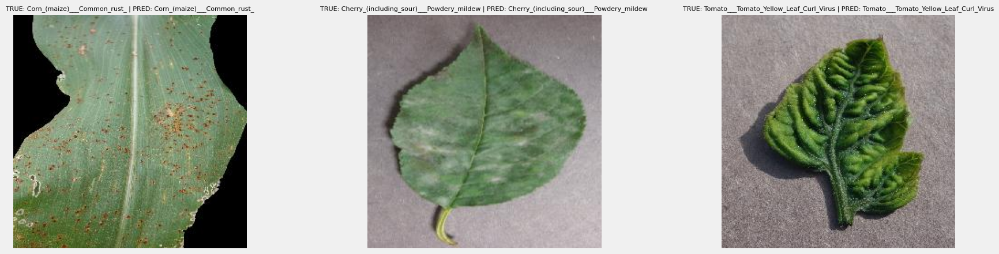

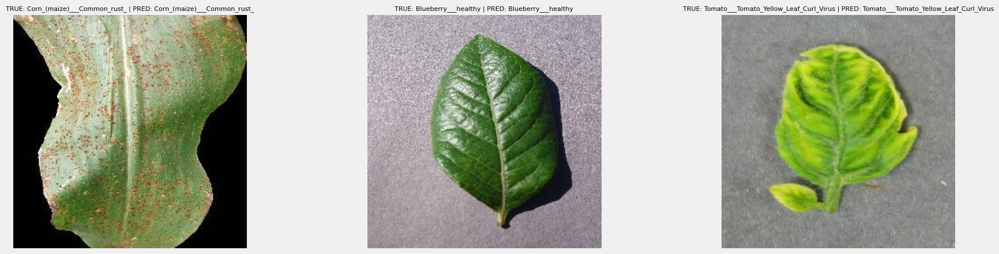

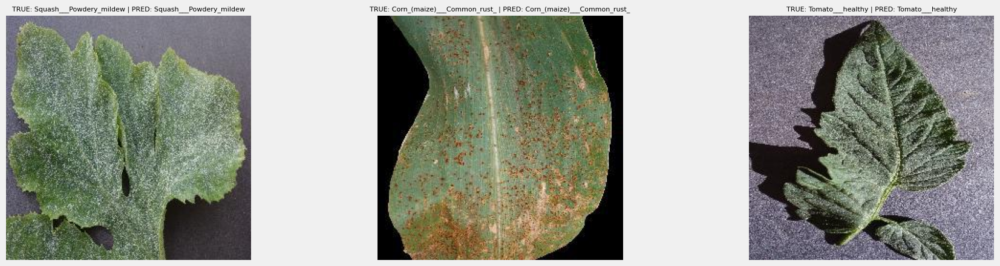

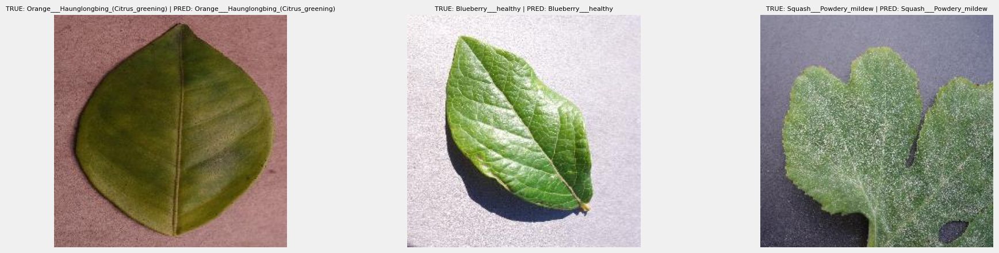

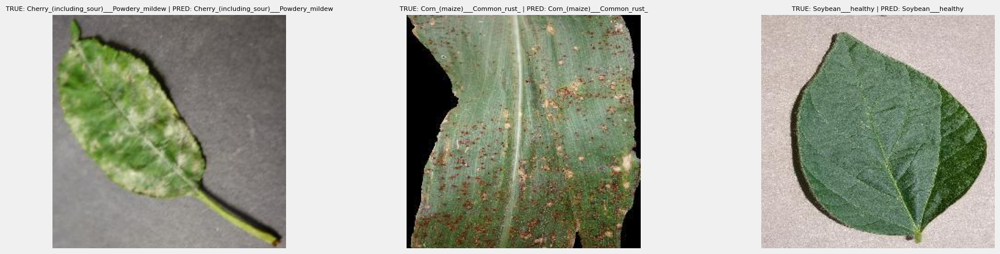

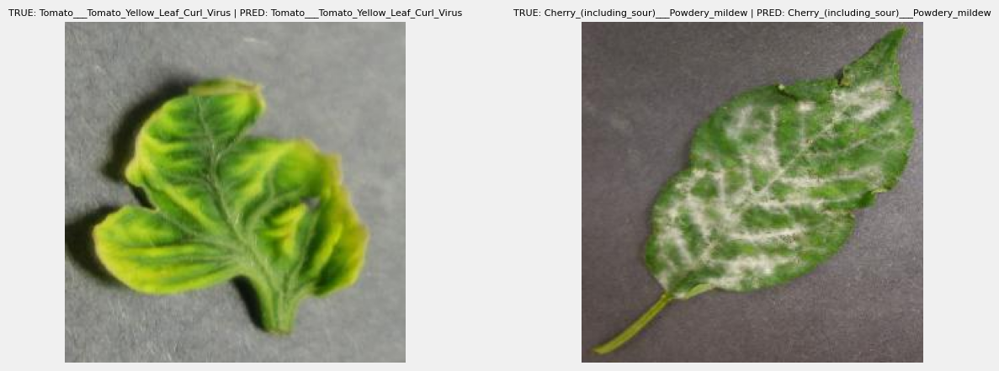

In [37]:
# plot images that were correctly predicted by a model

plt.figure(figsize=(20, 15))  # Adjust the figure size
for i, row in Predictions[Predictions["Test Labels"] == Predictions["Prediction Labels"]].sort_values("Prediction Probability").tail(20).reset_index().iterrows():
    if i % 3 == 0:  # Start a new row every 3 images
        plt.figure(figsize=(20, 5))  # Adjust the figure size for each row
    plt.subplot(1, 3, i % 3 + 1)  # Use 1 row and 3 columns for each row
    image_path = row['Path']
    image = Image.open(image_path)
    plt.imshow(image)
    plt.title(f'TRUE: {row["Test Classes"]} | PRED: {row["Prediction Classes"]}', fontsize=8)
    plt.axis('off')
    
plt.show()


# Confusion Matrix

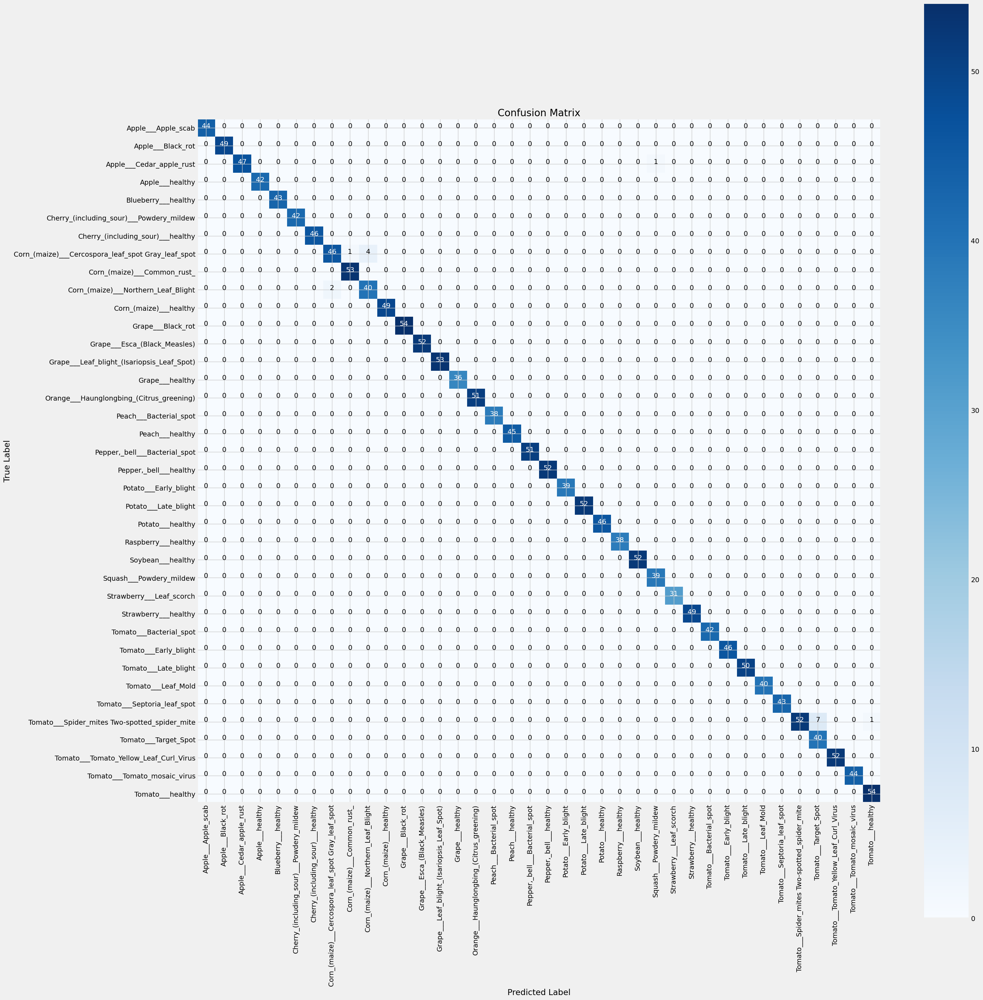

In [56]:
preds = model.predict_generator(test_images)
y_pred = np.argmax(preds, axis=1)
g_dict = test_images.class_indices
classes = list(g_dict.keys())

# Confusion matrix
cm = confusion_matrix(test_images.classes, y_pred)

plt.figure(figsize=(30, 30))
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()

tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation=90)
plt.yticks(tick_marks, classes, rotation=0)  # Rotate the y-axis labels 90 degrees

thresh = cm.max() / 2.
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(j, i, cm[i, j], horizontalalignment='center', color='white' if cm[i, j] > thresh else 'black')

plt.tight_layout()
plt.ylabel('True Label')
plt.xlabel('Predicted Label')

plt.show()


In [61]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.applications.efficientnet import preprocess_input
import numpy as np

# Load and preprocess an image for prediction
img_path = '/kaggle/input/new-plant-diseases-dataset/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train/Apple___Apple_scab/00075aa8-d81a-4184-8541-b692b78d398a___FREC_Scab 3335.JPG' 
img = load_img(img_path, target_size=(224, 224))  # Adjust target_size as needed

# Convert the image to an array and preprocess it
img_array = img_to_array(img)
img_array = preprocess_input(img_array)  # Preprocess the image according to EfficientNet B5 requirements

# Now, you can use this prepared image as 'your_input_data'
predictions = model.predict(np.expand_dims(img_array, axis=0))
predictions

1/1 [==============================] - 0s 40ms/step


array([[9.9996614e-01, 4.0646857e-08, 1.0741024e-05, 1.0369971e-05,
        2.1393257e-08, 4.9561686e-06, 5.0123452e-09, 2.9822297e-07,
        2.9346797e-10, 1.7299426e-08, 2.8002908e-10, 1.9898827e-09,
        3.7829517e-10, 4.6363535e-08, 3.3139469e-07, 2.3584334e-09,
        4.2892066e-06, 1.8176674e-07, 3.5888242e-08, 5.9931358e-09,
        1.1264132e-07, 2.2252111e-06, 3.5065455e-08, 1.5170089e-08,
        3.0413371e-08, 9.8151595e-08, 3.5065455e-08, 3.9415522e-08,
        2.4424571e-10, 5.1807908e-10, 5.2683045e-09, 5.6750338e-08,
        1.5679898e-09, 1.6206841e-10, 1.7221000e-09, 1.4529887e-09,
        1.4416813e-09, 9.3068053e-11]], dtype=float32)

In [69]:
# Assuming predictions is your array
highest_probability_index = np.argmax(predictions)
highest_probability = predictions[0][highest_probability_index]

print(f"The highest probability is {highest_probability:.2f} for class index {highest_probability_index}")
print(f"The index 0 label is {classes[highest_probability_index]} ")

The highest probability is 1.00 for class index 0
The index 0 label is Apple___Apple_scab 


# Prediction on Test images

In [71]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.applications.efficientnet import preprocess_input
import numpy as np
import os

# Directory containing the images you want to predict
image_dir = '/kaggle/input/new-plant-diseases-dataset/test/test'

# Get a list of image file names in the directory
image_files = os.listdir(image_dir)

# Initialize an empty list to store predictions
all_predictions = []

# Loop through each image file and make predictions
for image_file in image_files:
    # Construct the full path to the image
    img_path = os.path.join(image_dir, image_file)
    
    # Load and preprocess the image
    img = load_img(img_path, target_size=(224, 224))  # Adjust target_size as needed
    img_array = img_to_array(img)
    img_array = preprocess_input(img_array)  # Preprocess the image according to EfficientNet B5 requirements

    # Make predictions for the image
    predictions = model.predict(np.expand_dims(img_array, axis=0))
    
    # Assuming predictions is your array
    highest_probability_index = np.argmax(predictions)
    highest_probability = predictions[0][highest_probability_index]
    predicted_label = classes[highest_probability_index]

    # Append the prediction result to the list
    all_predictions.append({
        'image_file': image_file,
        'highest_probability': highest_probability,
        'predicted_label': predicted_label
    })

# Print or save the predictions for all images
for prediction in all_predictions:
    print(f"Image: {prediction['image_file']}")
    print(f"Highest Probability: {prediction['highest_probability']:.2f}")
    print(f"Predicted Label: {prediction['predicted_label']}\n")


1/1 [==============================] - 0s 53ms/step
Image: TomatoEarlyBlight6.JPG
Highest Probability: 0.96
Predicted Label: Tomato___Early_blight

Image: TomatoYellowCurlVirus4.JPG
Highest Probability: 1.00
Predicted Label: Tomato___Tomato_Yellow_Leaf_Curl_Virus

Image: TomatoYellowCurlVirus6.JPG
Highest Probability: 1.00
Predicted Label: Tomato___Tomato_Yellow_Leaf_Curl_Virus

Image: PotatoHealthy2.JPG
Highest Probability: 1.00
Predicted Label: Potato___healthy

Image: TomatoYellowCurlVirus5.JPG
Highest Probability: 1.00
Predicted Label: Tomato___Tomato_Yellow_Leaf_Curl_Virus

Image: PotatoEarlyBlight2.JPG
Highest Probability: 1.00
Predicted Label: Potato___Early_blight

Image: TomatoYellowCurlVirus3.JPG
Highest Probability: 1.00
Predicted Label: Tomato___Tomato_Yellow_Leaf_Curl_Virus

Image: TomatoEarlyBlight3.JPG
Highest Probability: 1.00
Predicted Label: Tomato___Early_blight

Image: CornCommonRust2.JPG
Highest Probability: 1.00
Predicted Label: Corn_(maize)___Common_rust_

Image: